In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge,Lasso,ElasticNet  
from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR  
import lightgbm as lgb 
from xgboost import XGBRFRegressor

from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error 
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [2]:
all_data = pd.read_csv('./processed_data_2.csv')

cond = all_data['label'] == 'train'
train_data = all_data[cond]
train_data.drop(labels = 'label',axis = 1,inplace = True)

X = train_data.drop(labels='target',axis = 1)
y = train_data['target']

X_train,X_valid,y_train,y_valid=train_test_split(X,y,test_size=0.2)

cond2 = all_data['label'] == 'test'
submit_test = all_data[cond2]
submit_test.drop(labels = ['label','target'],axis = 1,inplace = True)

In [3]:
X_pca = np.load('./train_data_pca.npz')['X_train']
y_pca = np.load('./train_data_pca.npz')['y_train']

X_train_pca,X_valid_pca,y_train_pca,y_valid_pca=train_test_split(X_pca,y_pca,test_size=0.2)

submit_test_pca = np.load('./test_data_pca.npz')['X_test']

### GridSearchCV

In [4]:
def train_model(model, param_grid=[], X=[], y=[], splits=5, repeats=5):
        
    rk_fold = RepeatedKFold(n_splits=splits, n_repeats=repeats) 
    
    gsearch = GridSearchCV(model, param_grid, cv=rk_fold,
                           scoring='neg_mean_squared_error',
                           verbose=1, return_train_score=True)

    gsearch.fit(X,y)

    model = gsearch.best_estimator_        

    best_idx = gsearch.best_index_ 
    grid_results = pd.DataFrame(gsearch.cv_results_)       
    cv_mean = abs(grid_results.loc[best_idx,'mean_test_score'])
    cv_std = grid_results.loc[best_idx,'std_test_score']
    
    cv_score = pd.Series({'mean':cv_mean,'std':cv_std})

    y_pred = model.predict(X)
    
    print('----------------------')
    print(model)
    print('----------------------')
    print('score=',model.score(X,y))
    print('mse=',mean_squared_error(y, y_pred))
    print('cross_val: mean=',cv_mean,', std=',cv_std)
    
    y_pred = pd.Series(y_pred,index=y.index)
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    z = (resid - mean_resid)/std_resid 
    n_outliers = sum(abs(z)>3)
    
    plt.figure(figsize=(15,5))
    plt.subplot(1, 3, 1)
    plt.plot(y,y_pred,'.')
    plt.xlabel('y')
    plt.ylabel('y_pred')
    plt.title('corr = {:.3f}'.format(np.corrcoef(y,y_pred)[0][1]))

    plt.subplot(1, 3, 2)
    plt.plot(y,y-y_pred,'.')
    plt.xlabel('y')
    plt.ylabel('y - y_pred')
    plt.title('std resid = {:.3f}'.format(std_resid))
    
    ax3=plt.subplot(1,3,3)
    z.plot.hist(bins=50,ax=ax3)
    plt.xlabel('z')
    plt.title('{:.0f} samples with z>3'.format(n_outliers))

    return model, cv_score, grid_results

In [5]:
opt_models = dict()
score_models = pd.DataFrame(columns=['mean','std'])

splits = 5
repeats = 5

Fitting 25 folds for each of 25 candidates, totalling 625 fits
----------------------
Ridge(alpha=0.1)
----------------------
score= 0.8885219773738782
mse= 0.10224325299028403
cross_val: mean= 0.1047844173206438 , std= 0.00659514671424574


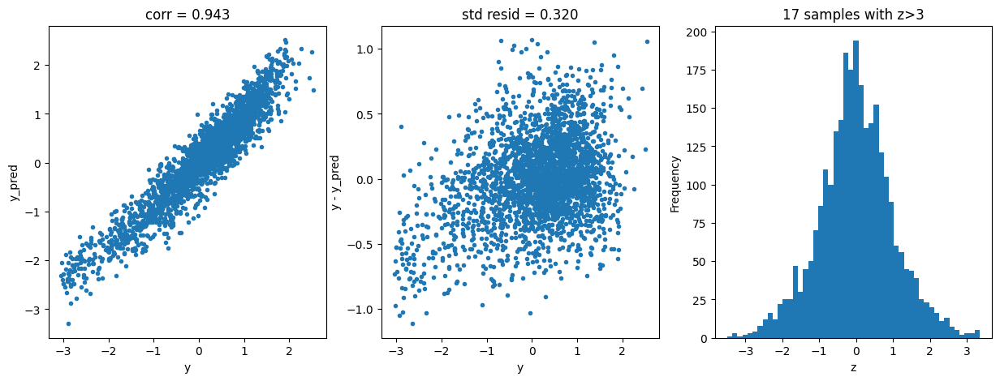

In [6]:
model = 'Ridge'
opt_models[model] = Ridge()

alphas = np.arange(0.1,5,0.2)
param_grid = {'alpha': alphas}

opt_models[model],cv_score,grid_results = train_model(opt_models[model],
                                                      param_grid=param_grid,
                                                      X = X,y = y,
                                                      splits=splits, repeats=repeats)

cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

In [7]:
alphas.shape

(25,)

In [8]:
score_models

,mean,std,0
mean,NaN,NaN,0.104784
std,NaN,NaN,0.006595


In [9]:
grid_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split17_train_score,split18_train_score,split19_train_score,split20_train_score,split21_train_score,split22_train_score,split23_train_score,split24_train_score,mean_train_score,std_train_score
0,0.004454,0.002810,0.002991,0.002831,0.1,{'alpha': 0.1},-0.107120,-0.091924,-0.107948,-0.101432,...,-0.102151,-0.101438,-0.103425,-0.100473,-0.103465,-0.102891,-0.101031,-0.101963,-0.101968,0.001612
1,0.003669,0.002293,0.003134,0.002605,0.3,{'alpha': 0.30000000000000004},-0.107035,-0.092312,-0.107862,-0.101485,...,-0.102224,-0.101541,-0.103546,-0.100558,-0.103549,-0.102985,-0.101132,-0.102064,-0.102062,0.001610
2,0.003400,0.002111,0.003313,0.002025,0.5,{'alpha': 0.5000000000000001},-0.106964,-0.092679,-0.107920,-0.101555,...,-0.102325,-0.101670,-0.103694,-0.100671,-0.103656,-0.103106,-0.101263,-0.102190,-0.102182,0.001607
3,0.004478,0.002924,0.003346,0.002343,0.7,{'alpha': 0.7000000000000002},-0.106905,-0.093028,-0.108043,-0.101635,...,-0.102440,-0.101810,-0.103849,-0.100796,-0.103774,-0.103239,-0.101405,-0.102324,-0.102313,0.001605
4,0.005715,0.004016,0.004305,0.002583,0.9,{'alpha': 0.9000000000000001},-0.106859,-0.093362,-0.108199,-0.101721,...,-0.102566,-0.101957,-0.104007,-0.100930,-0.103898,-0.103380,-0.101555,-0.102461,-0.102450,0.001604
5,0.003496,0.002045,0.003423,0.002671,1.1,{'alpha': 1.1},-0.106826,-0.093686,-0.108375,-0.101814,...,-0.102699,-0.102109,-0.104167,-0.101071,-0.104027,-0.103527,-0.101710,-0.102602,-0.102592,0.001603
6,0.003545,0.001844,0.002493,0.001749,1.3,{'alpha': 1.3000000000000003},-0.106806,-0.094000,-0.108563,-0.101911,...,-0.102839,-0.102266,-0.104329,-0.101218,-0.104160,-0.103678,-0.101869,-0.102744,-0.102738,0.001603
7,0.002720,0.001826,0.003157,0.002359,1.5,{'alpha': 1.5000000000000002},-0.106797,-0.094307,-0.108759,-0.102012,...,-0.102983,-0.102426,-0.104493,-0.101369,-0.104297,-0.103833,-0.102031,-0.102888,-0.102888,0.001602
8,0.005242,0.002568,0.003410,0.001761,1.7,{'alpha': 1.7000000000000004},-0.106798,-0.094605,-0.108959,-0.102117,...,-0.103130,-0.102588,-0.104658,-0.101523,-0.104436,-0.103990,-0.102194,-0.103033,-0.103039,0.001602
9,0.003603,0.002601,0.002894,0.002155,1.9,{'alpha': 1.9000000000000004},-0.106809,-0.094897,-0.109161,-0.102224,...,-0.103280,-0.102753,-0.104823,-0.101680,-0.104577,-0.104149,-0.102360,-0.103179,-0.103192,0.001602


Fitting 25 folds for each of 23 candidates, totalling 575 fits
----------------------
Lasso(alpha=0.0001)
----------------------
score= 0.8884361433689166
mse= 0.10232197655998607
cross_val: mean= 0.10515641832903938 , std= 0.007876329686042191
CPU times: user 4min 46s, sys: 1min 8s, total: 5min 54s
Wall time: 57.6 s


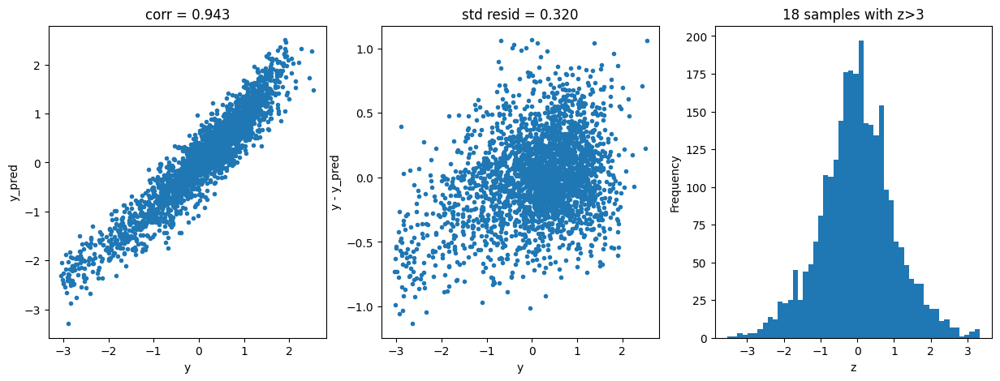

In [10]:
%%time
model = 'Lasso'

opt_models[model] = Lasso()
alphas = np.arange(1e-4,1e-3,4e-5)
param_grid = {'alpha': alphas}

opt_models[model], cv_score, grid_results = train_model(opt_models[model],
                                                        param_grid=param_grid,
                                                        X = X,y = y,
                                                        splits=splits, repeats=repeats)

cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

In [11]:
grid_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_alpha', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'split15_test_score', 'split16_test_score',
       'split17_test_score', 'split18_test_score', 'split19_test_score',
       'split20_test_score', 'split21_test_score', 'split22_test_score',
       'split23_test_score', 'split24_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'split3_train_score',
       'split4_train_score', 'split5_train_score', 'split6_train_score',
       'split7_train_score', 'split8_train_score', 'split9_train

Fitting 25 folds for each of 81 candidates, totalling 2025 fits
----------------------
ElasticNet(alpha=0.0001, l1_ratio=0.9, max_iter=10000)
----------------------
score= 0.8884400610654271
mse= 0.10231838340300306
cross_val: mean= 0.10475369529179407 , std= 0.004877974443772701


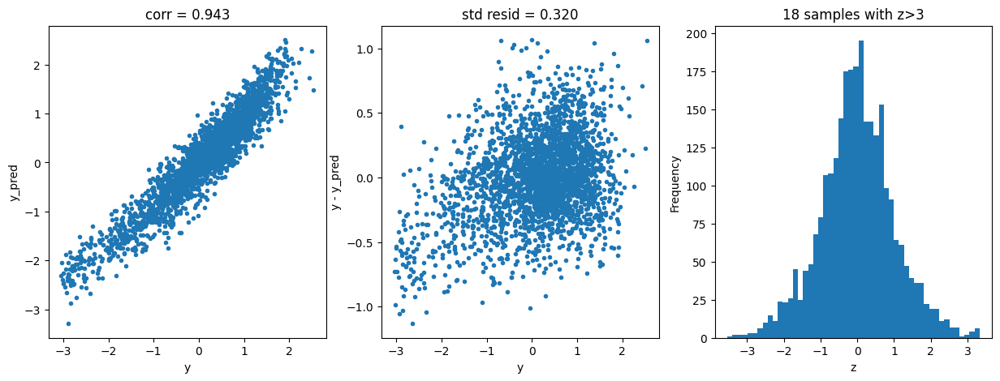

In [12]:
model ='ElasticNet'
opt_models[model] = ElasticNet(max_iter=10000)

param_grid = {'alpha': np.arange(1e-4,1e-3,1e-4),
              'l1_ratio': np.arange(0.1,1.0,0.1)}

opt_models[model], cv_score, grid_results = train_model(opt_models[model],
                                                        param_grid=param_grid,
                                                        X = X,y = y,
                                                        splits=splits, repeats=repeats)

cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

In [13]:
np.arange(0.1,1.0,0.1).shape

(9,)

In [14]:
np.arange(1e-4,1e-3,1e-4).shape

(9,)

Fitting 25 folds for each of 5 candidates, totalling 125 fits
----------------------
SVR(C=0.9000000000000001)
----------------------
score= 0.7289831728011497
mse= 0.24856596282524254
cross_val: mean= 0.24953448865573208 , std= 0.013365865390199542
CPU times: user 38.9 s, sys: 87.3 ms, total: 39 s
Wall time: 39.1 s


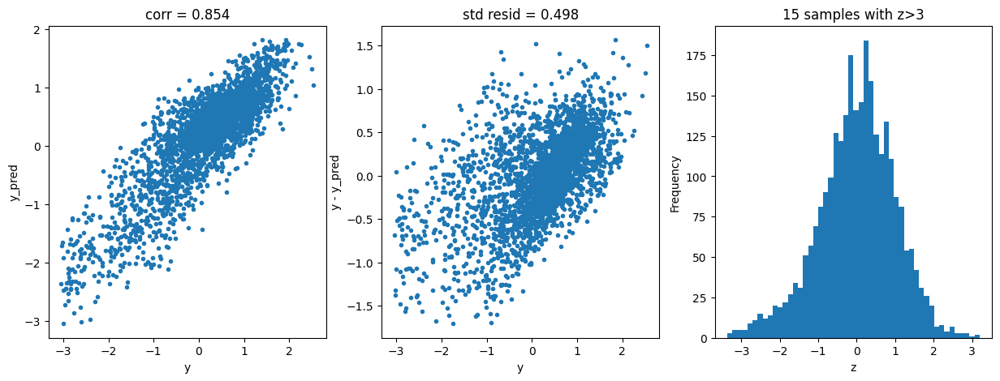

In [15]:
%%time
model='SVR'
opt_models[model] = SVR()

param_grid = {'C':np.arange(0.1,1.0,0.2)}

opt_models[model], cv_score, grid_results = train_model(opt_models[model],
                                                        param_grid=param_grid,
                                                        X = X,y = y,
                                                        splits=splits, repeats=repeats)


cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

#### GBDT

Fitting 5 folds for each of 27 candidates, totalling 135 fits
----------------------
GradientBoostingRegressor(max_depth=5, min_samples_split=6, n_estimators=300)
----------------------
score= 0.9932943739878604
mse= 0.006150136149407937
cross_val: mean= 0.09069618226485396 , std= 0.004474604773996087
CPU times: user 9min 17s, sys: 1.89 s, total: 9min 19s
Wall time: 9min 35s


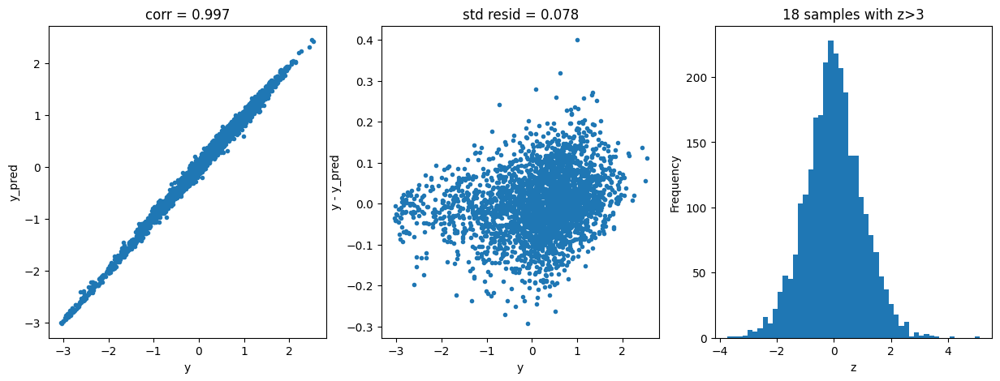

In [16]:
%%time
model = 'GradientBoosting'
opt_models[model] = GradientBoostingRegressor()

param_grid = {'n_estimators':[100,200,300],
              'max_depth':[3,5,7],
              'min_samples_split':[5,6,7]}

opt_models[model], cv_score, grid_results = train_model(opt_models[model],
                                                        param_grid=param_grid,
                                                        X = X,y = y,
                                                        splits=splits, repeats=1)

cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
----------------------
RandomForestRegressor(max_features=12, min_samples_split=5, n_estimators=300)
----------------------
score= 0.9816935094213004
mse= 0.01678999235463344
cross_val: mean= 0.09722380880639986 , std= 0.008625273899409662
CPU times: user 10min 41s, sys: 848 ms, total: 10min 42s
Wall time: 10min 47s


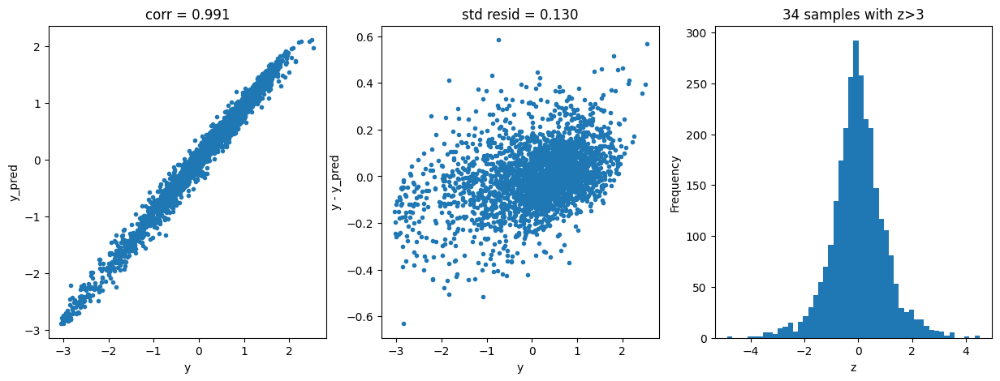

In [17]:
%%time
model = 'RandomForest'
opt_models[model] = RandomForestRegressor()

param_grid = {'n_estimators':[100,200,300],
              'max_features':[12,16,20,24],
              'min_samples_split':[5,7,9]}

opt_models[model], cv_score, grid_results = train_model(opt_models[model],
                                                        param_grid=param_grid,
                                                        X = X,y = y,
                                                        splits=splits, repeats=1)

cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
----------------------
XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None, device=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=5, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=300, n_jobs=None,
               num_parallel_tree=None, objective='reg:squarederror',
               random_state=None, reg_alpha=None, ...)
----------------------
score= 0.8974477326401544
mse= 0.09405690170488365
cross_val: mean= 0.1188434200101186 , std= 0.0088700188585

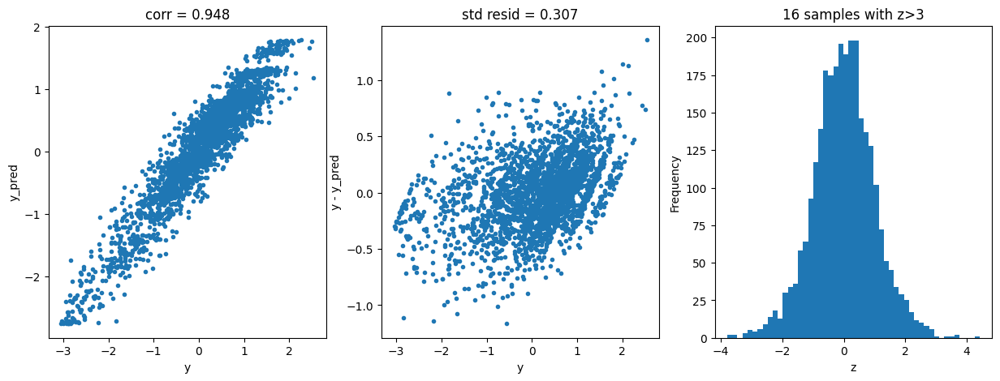

In [18]:
%%time
model = 'XGB'
opt_models[model] = XGBRFRegressor()

param_grid = {'n_estimators':[200,300],
              'max_depth':[3,5],
              'reg_lambda': np.arange(1e-5,1e-3,1e-4)}

opt_models[model], cv_score,grid_results = train_model(opt_models[model],
                                                        param_grid=param_grid,
                                                        X = X,y = y,
                                                        splits=splits, repeats=1)

cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

Fitting 5 folds for each of 192 candidates, totalling 960 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6202
[LightGBM] [Info] Number of data points in the train set: 2232, number of used features: 25
[LightGBM] [Info] Start training from score 0.144101
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

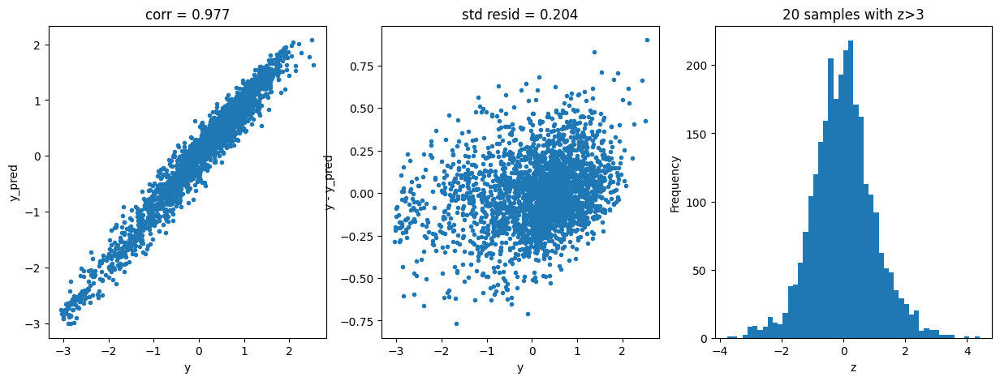

In [19]:
%%time
model = 'lightGBM'
opt_models[model] = lgb.LGBMRegressor()

param_grid = {'n_estimators':[200,300],
              'max_depth':[3,5],
              'min_child_weight': range(3, 6, 1),
              'reg_alpha': [1e-5, 1e-2, 0.1, 1],
              'reg_lambda': [1e-5, 1e-2, 0.1, 1]}

opt_models[model], cv_score,grid_results = train_model(opt_models[model],
                                                        param_grid=param_grid,
                                                        X = X,y = y,
                                                        splits=splits, repeats=1)

cv_score.name = model
score_models = pd.concat([score_models,cv_score],axis=0)

In [20]:
score_models

,mean,std,0
mean,NaN,NaN,0.104784
std,NaN,NaN,0.006595
mean,NaN,NaN,0.105156
std,NaN,NaN,0.007876
mean,NaN,NaN,0.104754
std,NaN,NaN,0.004878
mean,NaN,NaN,0.249534
std,NaN,NaN,0.013366
mean,NaN,NaN,0.090696
std,NaN,NaN,0.004475


In [21]:
opt_models

{'Ridge': Ridge(alpha=0.1),
 'Lasso': Lasso(alpha=0.0001),
 'ElasticNet': ElasticNet(alpha=0.0001, l1_ratio=0.9, max_iter=10000),
 'SVR': SVR(C=0.9000000000000001),
 'GradientBoosting': GradientBoostingRegressor(max_depth=5, min_samples_split=6, n_estimators=300),
 'RandomForest': RandomForestRegressor(max_features=12, min_samples_split=5, n_estimators=300),
 'XGB': XGBRFRegressor(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bytree=None, device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, gamma=None,
                grow_policy=None, importance_type=None,
                interaction_constraints=None, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=5, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                multi_strategy=

### bagging

In [22]:
def model_predict(submit_test):
    i=0
    y_predict_total = np.zeros(submit_test.shape[0])
    
    for model in opt_models.keys():
        y_predict = opt_models[model].predict(submit_test)
        
        y_predict_total += y_predict
        
        i+=1
    y_predict_mean = np.round(y_predict_total/i,3)
    
    return y_predict_mean

In [23]:
result = model_predict(submit_test)

np.savetxt('./bagging_result.txt',result)

In [24]:
result

array([ 0.244,  0.201, -0.136, ..., -2.638, -2.681, -2.515])